# Explore superpixels 
We use the finetune datasets to find appropriate parameters for the superpixel algorithm. These inludes the:
</ol>
<li> Super pixel algorithm 
<li> Spectral bands
<li> Spectral Index
<li> Threshold method and cutoff
<ol\>

In [2]:
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd

import importlib
import utils
importlib.reload(utils)

import evaluation as eval

import glob
base_path = '../../data/'

import warnings
warnings.filterwarnings("ignore")

/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/venv_sp/lib/python3.9/site-packages/dask/dataframe/__init__.py:31: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [2]:
# load finetune dataset 
finetune_lics = glob.glob(base_path + '/LICS/finetune/*.npy')
lics_mask = [np.load(path)[:,:,-1] for path in finetune_lics]
print(len(finetune_lics))

finetune_swed = glob.glob(base_path + '/swed/finetune/*.npy')
swed_mask = [np.load(path)[:,:,-1] for path in finetune_swed]
print(len(finetune_swed))

100
100


array([[1., 1., 1., ..., 1., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       [1., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.],
       [0., 0., 0., ..., 1., 1., 1.]])

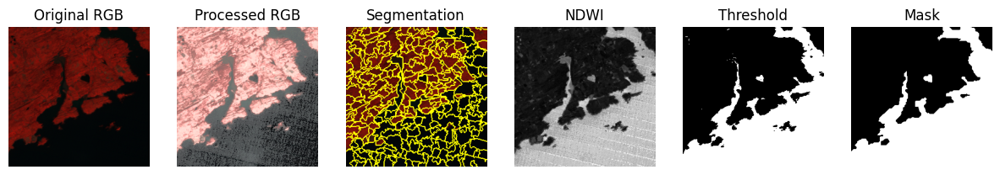

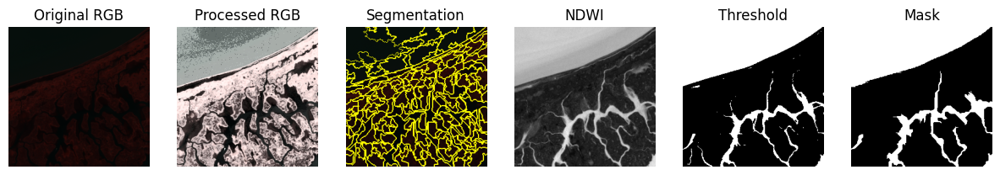

In [13]:
# Example from LICS
i = 5
all_bands = np.load(finetune_lics[i])
utils.get_mask_from_bands(all_bands, 
                            satellite='landsat',
                            rgb_bands=["nir","green","blue"],
                            threshold=-1, 
                            index_name='NDWI',
                            method='felzenszwalb',
                            min_size=60,
                            display=True)

# Example from SWED
i = np.random.randint(0, len(finetune_swed))
all_bands = np.load(finetune_swed[i])
utils.get_mask_from_bands(all_bands, 
                            satellite='sentinel',
                            rgb_bands=["nir","green","blue"],
                            threshold=0, 
                            index_name='NDWI',
                            method='felzenszwalb',
                            min_size=60,
                            display=True)

# Demonstration of algorithm

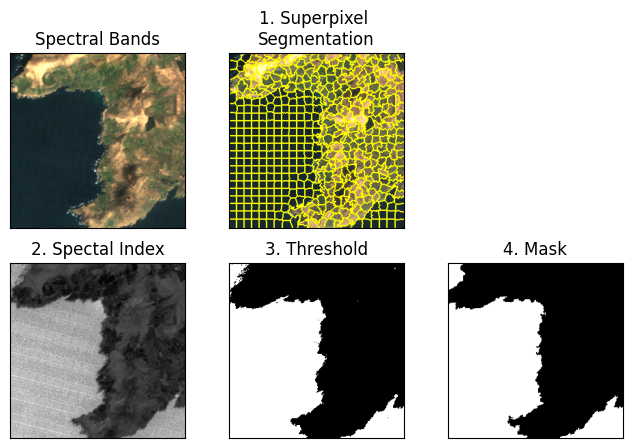

In [11]:
# Visualisation of appraoch
i = 7
all_bands = np.load(finetune_lics[i])

# Example parameters
satellite='landsat'
rgb_bands=["red","green","blue"]
threshold=-1
index_name='NDWI'
method='slic'
n_segments=500

all_bands_ = all_bands.copy()

# Get 3 spectral bands
img = utils.get_rgb(all_bands_,bands=rgb_bands,satellite=satellite)

# Get index
index = utils.get_index(all_bands,satellite=satellite,index=index_name)

# Apply superpixel segmentation
segments = utils.get_segments(img,method=method, n_segments=n_segments)

# Apply Ostu thresholding
threshold = utils.get_threshold(index,threshold=threshold)
mask = utils.get_superpixel_mask(segments,threshold)

# Visualise process
fig, ax = plt.subplots(2, 3, figsize=(8, 5))

# Enhance contrast for visualisation
img_processed = utils.enhance_contrast(img,0.2)
ax[0,0].imshow(img_processed)
ax[0,0].set_title('Spectral Bands')

ax[0,1].imshow(utils.mark_boundaries(img_processed, segments))
ax[0,1].set_title('1. Superpixel \nSegmentation')

ax[1,0].imshow(index,cmap='gray')
ax[1,0].set_title('2. Spectal Index')

ax[1,1].imshow(threshold,cmap='gray')
ax[1,1].set_title('3. Threshold')

ax[1,2].imshow(mask, cmap="gray")
ax[1,2].set_title('4. Mask')

for a in ax:
    for aa in a:
        aa.set_xticks([])
        aa.set_yticks([])

ax[0,2].axis('off')
utils.save_fig(fig, 'superpixel_lics_example')

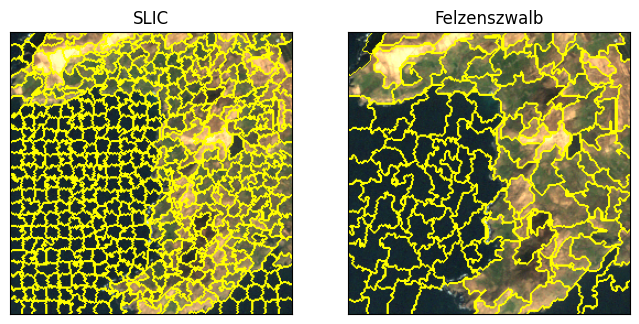

In [12]:
# Show different superpixel segmentation methods
slic = utils.get_segments(img_processed, method='slic', n_segments=500)
felzenszwalb = utils.get_segments(img_processed, method='felzenszwalb', min_size=130)

fig, ax = plt.subplots(1, 2, figsize=(8, 5))

ax[0].imshow(utils.mark_boundaries(img_processed, slic))
ax[0].set_title('SLIC')

ax[1].imshow(utils.mark_boundaries(img_processed, felzenszwalb))
ax[1].set_title('Felzenszwalb')

for a in ax:
    a.set_xticks([])
    a.set_yticks([])

utils.save_fig(fig, 'superpixel_methods')

# Find best parameters

In [11]:
def get_predictions(paths,satellite,rgb_bands,index_name,threshold = -1,method='slic', **kwargs):
    
    """
    Get predictions (i.e. masks) of superpixel segmentation approach for a given set of paths
        paths: list of paths in a fine-tune dataset
        other: parameters for superpixel segmentation algorithm
    """


    preds = []
    for path in paths:
        all_bands = np.load(path)
        mask = utils.get_mask_from_bands(all_bands, 
                                         satellite=satellite,
                                         rgb_bands=rgb_bands,
                                         threshold=threshold, 
                                         index_name=index_name,
                                         method=method, **kwargs)
        preds.append(mask)
    return preds

def process_predictions(dataset,masks, satellite):

    """ 
    Get results for different superpixel segmentation approaches
        dataset: list of paths in fine-tune dataset
        masks: list of masks
        satellite: satellite name
    """
    
    # Parameters
    rgb_bands = [["red", "green", "blue"], ["nir", "green", "blue"]]
    methods = ['slic', 'felzenszwalb']
    n_segments = [100, 200, 500, 1000]
    min_sizes = [650, 320, 130, 60]
    indices = ['NDWI', 'MNDWI']
    thresholds = [-1, 0]
    
    results = []

    for method in methods:
        for rgb_band in rgb_bands:
            for index in indices:
                for threshold in thresholds:
                    if method == 'slic':
                        for n_segment in n_segments:
                            # Get predictions
                            preds = get_predictions(dataset,
                                                    satellite=satellite,
                                                    threshold=threshold,
                                                    rgb_bands=rgb_band,
                                                    index_name=index,
                                                    method=method,
                                                    n_segments=n_segment)
                            
                            # Calculate accuracy
                            metrics, arr = eval.eval_metrics(masks, preds)
                            accuracy = metrics['accuracy']
                            
                            # Save results
                            results.append([method, rgb_band[0], n_segment, index, threshold, accuracy])
                            print(f"method: {method}, band: {rgb_band[0]}, n_segments: {n_segment}, index: {index}, threshold: {threshold} ,accuracy: {accuracy}")
                    elif method == 'felzenszwalb':
                        for min_size in min_sizes:
                            preds = get_predictions(dataset,
                                                    satellite=satellite,
                                                    threshold=threshold,
                                                    rgb_bands=rgb_band,
                                                    index_name=index,
                                                    method=method,
                                                    min_size=min_size)
                            metrics, arr = eval.eval_metrics(masks, preds)
                            accuracy = metrics['accuracy']

                            results.append([method, rgb_band[0], min_size, index, threshold, accuracy])
                            print(f"method: {method}, band: {rgb_band[0]}, min_size: {min_size}, index: {index}, threshold: {threshold}, accuracy: {accuracy}")

    results_df = pd.DataFrame(results, columns=['method', 'rgb_band', 'size', 'index','threshold', 'accuracy'])

    return results_df

In [17]:
# Process LICS dataset
results_lics = process_predictions(finetune_lics,lics_mask, satellite='landsat')
results_lics.to_csv('../data/annotation_parameters_lics.csv', index=False)

results_lics.sort_values(by='accuracy', ascending=False).head()

method: slic, band: red, n_segments: 100, index: NDWI, threshold: -1 ,accuracy: 0.9558779907226562
method: slic, band: red, n_segments: 200, index: NDWI, threshold: -1 ,accuracy: 0.9630284118652344
method: slic, band: red, n_segments: 500, index: NDWI, threshold: -1 ,accuracy: 0.9686322021484375
method: slic, band: red, n_segments: 1000, index: NDWI, threshold: -1 ,accuracy: 0.9708163452148437


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: slic, band: red, n_segments: 100, index: NDWI, threshold: 0 ,accuracy: 0.9474000549316406


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: slic, band: red, n_segments: 200, index: NDWI, threshold: 0 ,accuracy: 0.953856201171875


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: slic, band: red, n_segments: 500, index: NDWI, threshold: 0 ,accuracy: 0.9590606689453125


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: slic, band: red, n_segments: 1000, index: NDWI, threshold: 0 ,accuracy: 0.9610459899902344
method: slic, band: red, n_segments: 100, index: MNDWI, threshold: -1 ,accuracy: 0.9526132202148437
method: slic, band: red, n_segments: 200, index: MNDWI, threshold: -1 ,accuracy: 0.9597113037109375
method: slic, band: red, n_segments: 500, index: MNDWI, threshold: -1 ,accuracy: 0.9648306274414062
method: slic, band: red, n_segments: 1000, index: MNDWI, threshold: -1 ,accuracy: 0.9669523620605469
method: slic, band: red, n_segments: 100, index: MNDWI, threshold: 0 ,accuracy: 0.9475260925292969
method: slic, band: red, n_segments: 200, index: MNDWI, threshold: 0 ,accuracy: 0.9537002563476562
method: slic, band: red, n_segments: 500, index: MNDWI, threshold: 0 ,accuracy: 0.9577963256835937
method: slic, band: red, n_segments: 1000, index: MNDWI, threshold: 0 ,accuracy: 0.9602821350097657
method: slic, band: nir, n_segments: 100, index: NDWI, threshold: -1 ,accuracy: 0.9504780578613281
meth

/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: slic, band: nir, n_segments: 100, index: NDWI, threshold: 0 ,accuracy: 0.9430889892578125


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: slic, band: nir, n_segments: 200, index: NDWI, threshold: 0 ,accuracy: 0.9508578491210937


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: slic, band: nir, n_segments: 500, index: NDWI, threshold: 0 ,accuracy: 0.9586386108398437


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: slic, band: nir, n_segments: 1000, index: NDWI, threshold: 0 ,accuracy: 0.9611070251464844
method: slic, band: nir, n_segments: 100, index: MNDWI, threshold: -1 ,accuracy: 0.9484245300292968
method: slic, band: nir, n_segments: 200, index: MNDWI, threshold: -1 ,accuracy: 0.9568321228027343
method: slic, band: nir, n_segments: 500, index: MNDWI, threshold: -1 ,accuracy: 0.9636607360839844
method: slic, band: nir, n_segments: 1000, index: MNDWI, threshold: -1 ,accuracy: 0.9672103881835937
method: slic, band: nir, n_segments: 100, index: MNDWI, threshold: 0 ,accuracy: 0.9426765441894531
method: slic, band: nir, n_segments: 200, index: MNDWI, threshold: 0 ,accuracy: 0.9504460144042969
method: slic, band: nir, n_segments: 500, index: MNDWI, threshold: 0 ,accuracy: 0.9574006652832031
method: slic, band: nir, n_segments: 1000, index: MNDWI, threshold: 0 ,accuracy: 0.9599317932128906
method: felzenszwalb, band: red, min_size: 650, index: NDWI, threshold: -1, accuracy: 0.955125122070312

/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: felzenszwalb, band: red, min_size: 650, index: NDWI, threshold: 0, accuracy: 0.9469578552246094


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: felzenszwalb, band: red, min_size: 320, index: NDWI, threshold: 0, accuracy: 0.9537033081054688


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: felzenszwalb, band: red, min_size: 130, index: NDWI, threshold: 0, accuracy: 0.9585272216796875


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: felzenszwalb, band: red, min_size: 60, index: NDWI, threshold: 0, accuracy: 0.9608047485351563
method: felzenszwalb, band: red, min_size: 650, index: MNDWI, threshold: -1, accuracy: 0.9525923156738281
method: felzenszwalb, band: red, min_size: 320, index: MNDWI, threshold: -1, accuracy: 0.9595005798339844
method: felzenszwalb, band: red, min_size: 130, index: MNDWI, threshold: -1, accuracy: 0.9644062805175782
method: felzenszwalb, band: red, min_size: 60, index: MNDWI, threshold: -1, accuracy: 0.9668901062011719
method: felzenszwalb, band: red, min_size: 650, index: MNDWI, threshold: 0, accuracy: 0.9464994812011719
method: felzenszwalb, band: red, min_size: 320, index: MNDWI, threshold: 0, accuracy: 0.95395263671875
method: felzenszwalb, band: red, min_size: 130, index: MNDWI, threshold: 0, accuracy: 0.9573638916015625
method: felzenszwalb, band: red, min_size: 60, index: MNDWI, threshold: 0, accuracy: 0.95994873046875
method: felzenszwalb, band: nir, min_size: 650, index: NDWI

/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: felzenszwalb, band: nir, min_size: 650, index: NDWI, threshold: 0, accuracy: 0.9497515869140625


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: felzenszwalb, band: nir, min_size: 320, index: NDWI, threshold: 0, accuracy: 0.9562588500976562


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: felzenszwalb, band: nir, min_size: 130, index: NDWI, threshold: 0, accuracy: 0.960120849609375


/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/evaluation.py:151: RuntimeWarning: invalid value encountered in scalar divide
  precision = TP_ / (TP_ + FP_)


method: felzenszwalb, band: nir, min_size: 60, index: NDWI, threshold: 0, accuracy: 0.9624615478515625
method: felzenszwalb, band: nir, min_size: 650, index: MNDWI, threshold: -1, accuracy: 0.9557443237304688
method: felzenszwalb, band: nir, min_size: 320, index: MNDWI, threshold: -1, accuracy: 0.9631071472167969
method: felzenszwalb, band: nir, min_size: 130, index: MNDWI, threshold: -1, accuracy: 0.9659007263183593
method: felzenszwalb, band: nir, min_size: 60, index: MNDWI, threshold: -1, accuracy: 0.96885009765625
method: felzenszwalb, band: nir, min_size: 650, index: MNDWI, threshold: 0, accuracy: 0.9515789794921875
method: felzenszwalb, band: nir, min_size: 320, index: MNDWI, threshold: 0, accuracy: 0.9562818908691406
method: felzenszwalb, band: nir, min_size: 130, index: MNDWI, threshold: 0, accuracy: 0.9586775207519531
method: felzenszwalb, band: nir, min_size: 60, index: MNDWI, threshold: 0, accuracy: 0.9613290405273438


,method,rgb_band,size,index,threshold,accuracy
51,felzenszwalb,nir,60,NDWI,-1,0.972043
3,slic,red,1000,NDWI,-1,0.970816
35,felzenszwalb,red,60,NDWI,-1,0.970579
19,slic,nir,1000,NDWI,-1,0.970552
50,felzenszwalb,nir,130,NDWI,-1,0.969555


In [12]:
# Process SWED dataset
results_swed = process_predictions(finetune_swed,swed_mask, satellite='sentinel')
results_swed.to_csv('../data/annotation_parameters_swed.csv', index=False)

results_swed.sort_values(by='accuracy', ascending=False).head()

method: slic, band: red, n_segments: 100, index: NDWI, threshold: -1 ,accuracy: 0.9173861694335937
method: slic, band: red, n_segments: 200, index: NDWI, threshold: -1 ,accuracy: 0.9252268981933593
method: slic, band: red, n_segments: 500, index: NDWI, threshold: -1 ,accuracy: 0.9344491577148437
method: slic, band: red, n_segments: 1000, index: NDWI, threshold: -1 ,accuracy: 0.9390672302246094
method: slic, band: red, n_segments: 100, index: NDWI, threshold: 0 ,accuracy: 0.9179263305664063
method: slic, band: red, n_segments: 200, index: NDWI, threshold: 0 ,accuracy: 0.9271043395996094
method: slic, band: red, n_segments: 500, index: NDWI, threshold: 0 ,accuracy: 0.9362786865234375
method: slic, band: red, n_segments: 1000, index: NDWI, threshold: 0 ,accuracy: 0.9403443908691407
method: slic, band: red, n_segments: 100, index: MNDWI, threshold: -1 ,accuracy: 0.91809814453125
method: slic, band: red, n_segments: 200, index: MNDWI, threshold: -1 ,accuracy: 0.9254832458496094
method: slic

,method,rgb_band,size,index,threshold,accuracy
55,felzenszwalb,nir,60,NDWI,0,0.945070
23,slic,nir,1000,NDWI,0,0.944523
51,felzenszwalb,nir,60,NDWI,-1,0.943373
59,felzenszwalb,nir,60,MNDWI,-1,0.942819
19,slic,nir,1000,NDWI,-1,0.942435


# Visualise results

In [3]:

results_lics = pd.read_csv('../data/annotation_parameters_lics.csv')
results_swed = pd.read_csv('../data/annotation_parameters_swed.csv')

In [30]:

# Best results
print(results_lics.sort_values(by='accuracy', ascending=False).head(1))
print(results_swed.sort_values(by='accuracy', ascending=False).head(1))

print()
# Alternative threshold
print(results_lics[(results_lics['method'] == 'felzenszwalb') &
                         (results_lics['rgb_band'] == 'nir') &
                         (results_lics['index'] == 'NDWI') &
                         (results_lics['threshold'] == 0) &
                            (results_lics['size'] == 60)])

print(results_swed[(results_swed['method'] == 'felzenszwalb') &
                            (results_swed['rgb_band'] == 'nir') &
                            (results_swed['index'] == 'NDWI') &
                            (results_swed['threshold'] == -1) &
                                (results_swed['size'] == 60)])

print(round((0.972043-0.962462)*100,1))
print(round((0.94507-0.943373)*100,1))
     

          method rgb_band  size index  threshold  accuracy
51  felzenszwalb      nir    60  NDWI         -1  0.972043
          method rgb_band  size index  threshold  accuracy
55  felzenszwalb      nir    60  NDWI          0   0.94507

          method rgb_band  size index  threshold  accuracy
55  felzenszwalb      nir    60  NDWI          0  0.962462
          method rgb_band  size index  threshold  accuracy
51  felzenszwalb      nir    60  NDWI         -1  0.943373
1.0
0.2


1.2031402587890594
2.8068389892578427


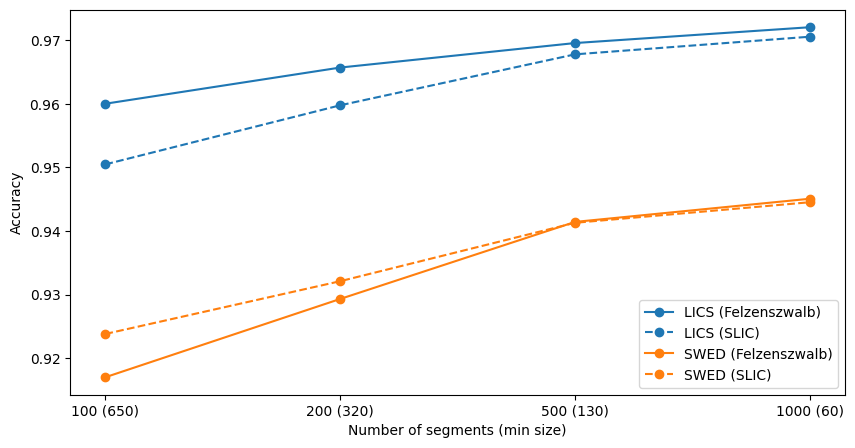

In [50]:
# Algorithm comparison
lics_felzenszwalb = results_lics[(results_lics['method'] == 'felzenszwalb') &
                         (results_lics['rgb_band'] == 'nir') &
                         (results_lics['index'] == 'NDWI') &
                         (results_lics['threshold'] == -1)].reset_index(drop=True)

print((lics_felzenszwalb['accuracy'][3]-lics_felzenszwalb['accuracy'][0])*100)

lics_slic = results_lics[(results_lics['method'] == 'slic') &
                         (results_lics['rgb_band'] == 'nir') &
                         (results_lics['index'] == 'NDWI') &
                         (results_lics['threshold'] == -1)]

swed_felzenszwalb = results_swed[(results_swed['method'] == 'felzenszwalb') &
                            (results_swed['rgb_band'] == 'nir') &
                            (results_swed['index'] == 'NDWI') &
                            (results_swed['threshold'] == 0)].reset_index(drop=True)

print((swed_felzenszwalb['accuracy'][3]-swed_felzenszwalb['accuracy'][0])*100)

swed_slic = results_swed[(results_swed['method'] == 'slic') &
                            (results_swed['rgb_band'] == 'nir') &
                            (results_swed['index'] == 'NDWI') &
                            (results_swed['threshold'] == 0)]

fig, ax = plt.subplots(1,1, figsize=(10, 5))

x_ticks = np.arange(0, len(lics_felzenszwalb), 1)

lics_color = 'tab:blue'
ax.plot(x_ticks, lics_felzenszwalb['accuracy'], marker='o', label='LICS (Felzenszwalb)', color=lics_color)
ax.plot(x_ticks, lics_slic['accuracy'], marker='o', label='LICS (SLIC)', linestyle='--', color=lics_color)

swed_color = 'tab:orange'
ax.plot(x_ticks, swed_felzenszwalb['accuracy'], marker='o', label='SWED (Felzenszwalb)', color=swed_color)
ax.plot(x_ticks, swed_slic['accuracy'], marker='o', label='SWED (SLIC)', linestyle='--', color=swed_color)


ax.set_xticks(x_ticks)
ax.set_xticklabels(['100 (650)','200 (320)','500 (130)','1000 (60)'])

ax.set_xlabel('Number of segments (min size)')
ax.set_ylabel('Accuracy')

ax.legend()
#utils.save_fig(fig, 'superpixel_algorithm_comparison')

{'whiskers': [<matplotlib.lines.Line2D at 0x2914fa040>,
 'caps': [<matplotlib.lines.Line2D at 0x2914f51f0>,
 'boxes': [<matplotlib.lines.Line2D at 0x291160820>,
 'medians': [<matplotlib.lines.Line2D at 0x29151de80>,
 'fliers': [<matplotlib.lines.Line2D at 0x291473a00>,
 'means': []}

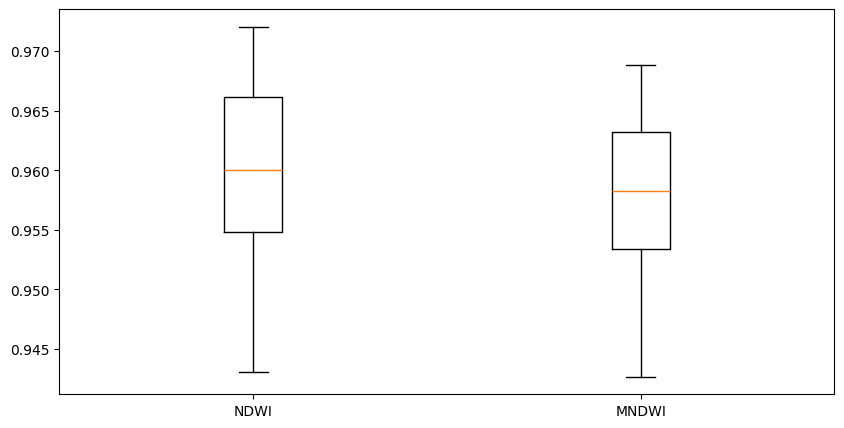

In [19]:
lics_ndwi = results_lics[results_lics['index'] == 'NDWI']
lics_mndwi = results_lics[results_lics['index'] == 'MNDWI']

fig, ax = plt.subplots(1,1, figsize=(10, 5))

# Plot box plot of accuracy
ax.boxplot([lics_ndwi['accuracy'], lics_mndwi['accuracy']], labels=['NDWI', 'MNDWI'])

# Archive

accuracy: 90.4432
balanced_accuracy: 91.1305
precision: 88.5383
recall: 91.6837
f1: 88.1577
mse: 4.804
fom: 52.848


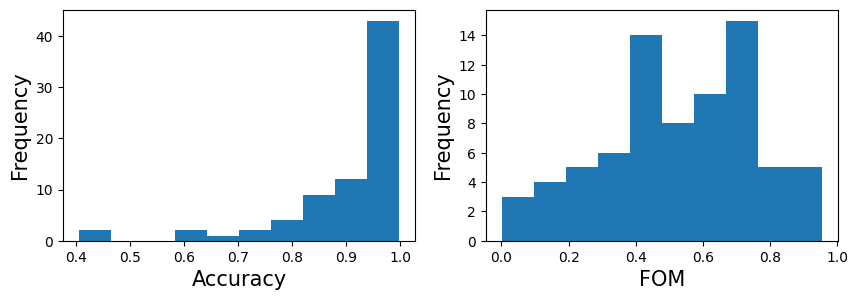

In [45]:
# Test
preds = get_predictions(finetune_swed,
                           satellite='sentinel',
                           rgb_bands=["nir", "green", "blue"],
                           index_name="NDWI",
                           threshold=-1, 
                           method='slic', 
                           n_segments=100)


metrics, arr = eval.eval_metrics(swed_mask,preds)
eval.display_metrics(metrics,arr)

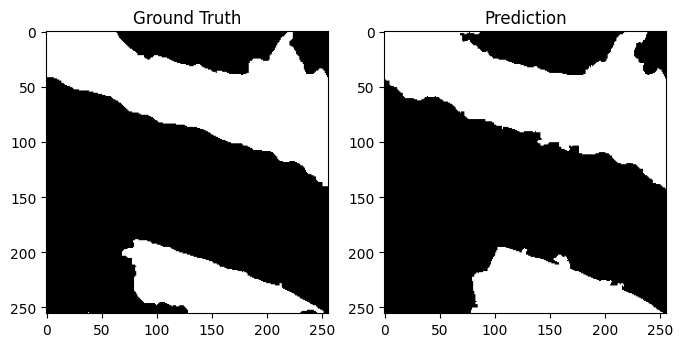

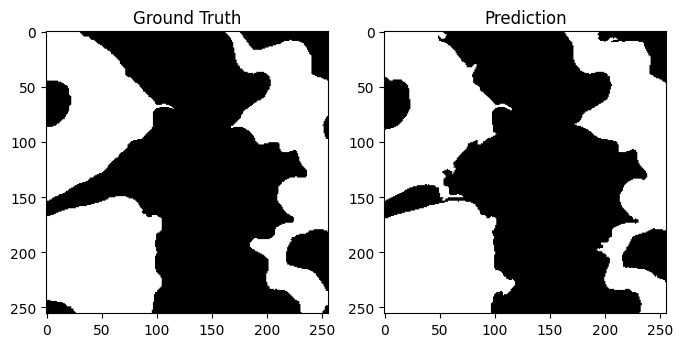

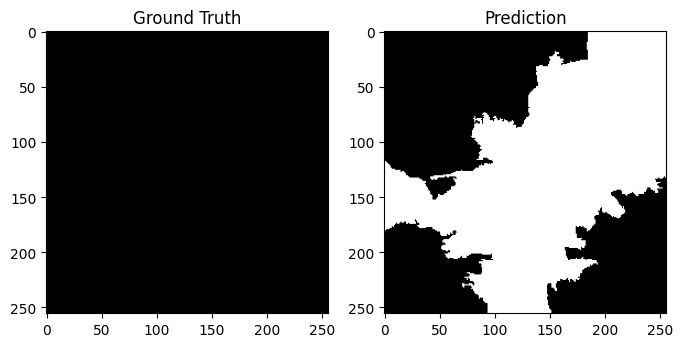

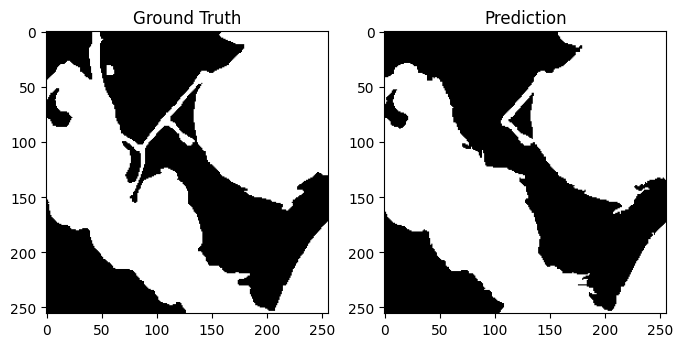

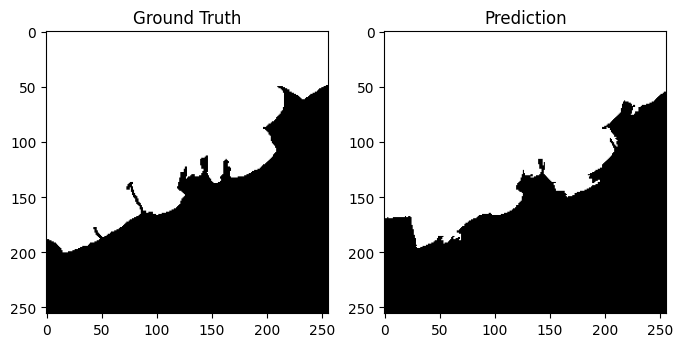

...

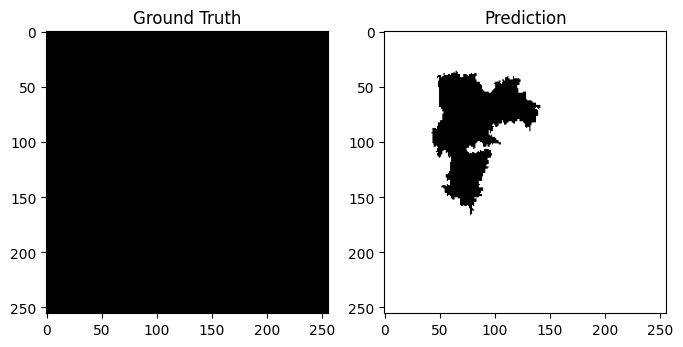

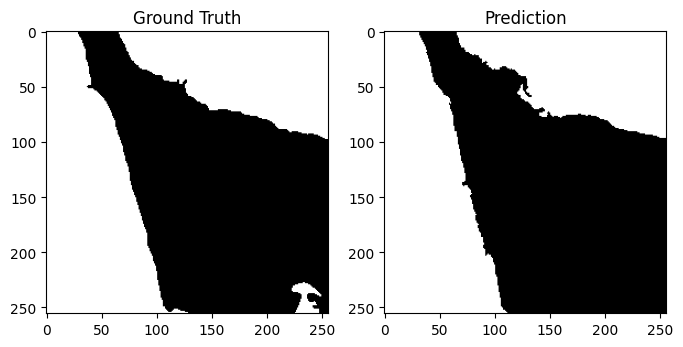

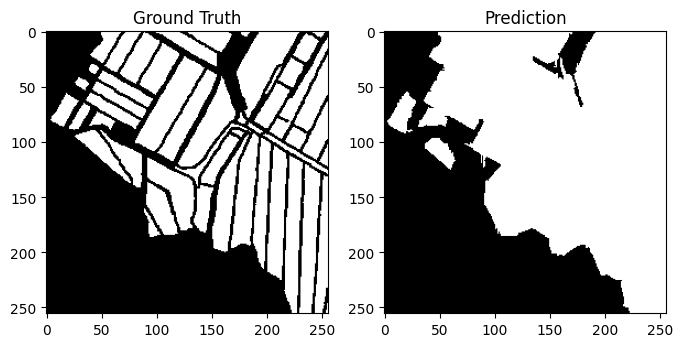

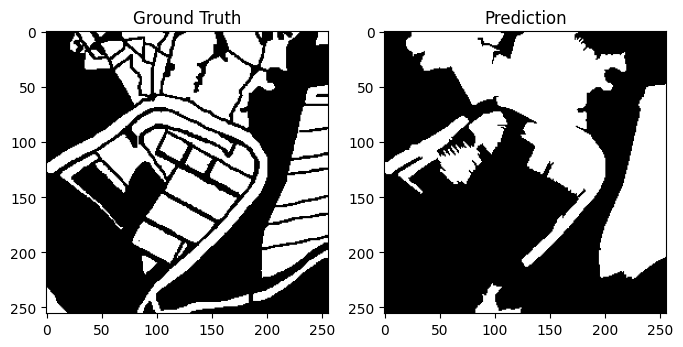

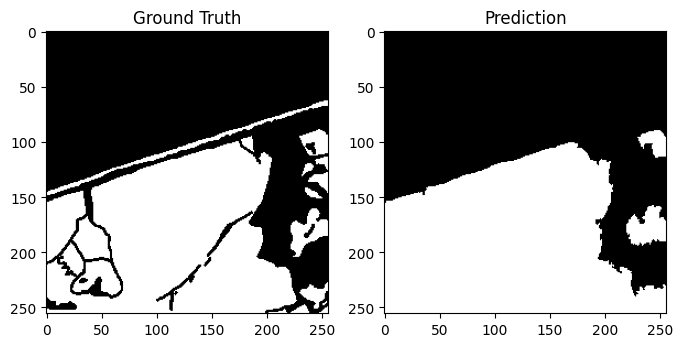

In [41]:
for i in range(100):
    mask = swed_mask[i]
    pred = preds[i]

    fig, ax = plt.subplots(1, 2, figsize=(8, 5))

    ax[0].imshow(mask, cmap='gray')
    ax[0].set_title('Ground Truth')

    ax[1].imshow(pred, cmap='gray')
    ax[1].set_title('Prediction')

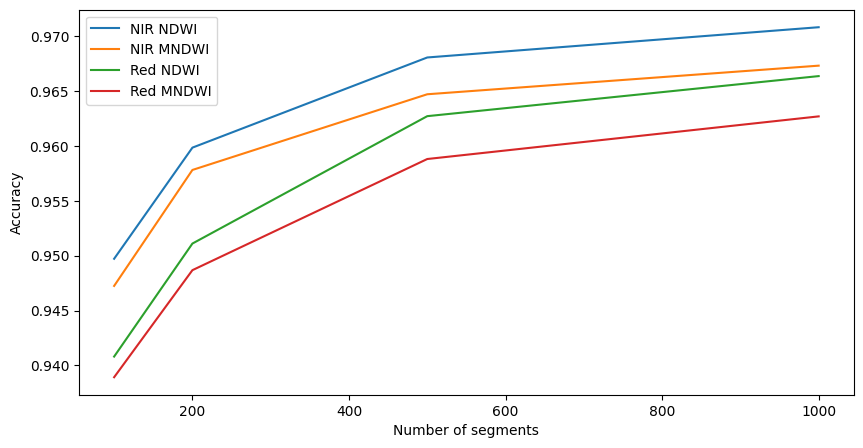

In [40]:
results = pd.read_csv('../data/sp_lics_results.csv')

method = 'slic'
slic = results[results['method']==method]
slic_red = slic[slic['rgb_band']=='red']
slic_nir = slic[slic['rgb_band']=='nir']
slic_red_ndwi = slic_red[slic_red['index']=='NDWI']
slic_nir_ndwi = slic_nir[slic_nir['index']=='NDWI']
slice_red_mndwi = slic_red[slic_red['index']=='MNDWI']
slice_nir_mndwi = slic_nir[slic_nir['index']=='MNDWI']

#Plot line plots by size
fig, ax = plt.subplots( 1, 1, figsize=(10, 5))

# Plot on log scale
ax.plot(slic_nir_ndwi['size'], slic_nir_ndwi['accuracy'], label='NIR NDWI')
ax.plot(slice_nir_mndwi['size'], slice_nir_mndwi['accuracy'], label='NIR MNDWI')
ax.plot(slic_red_ndwi['size'], slic_red_ndwi['accuracy'], label='Red NDWI')
ax.plot(slice_red_mndwi['size'], slice_red_mndwi['accuracy'], label='Red MNDWI')

ax.set_xlabel('Number of segments')
ax.set_ylabel('Accuracy')

ax.legend()

utils.save_fig(fig, 'paramaters_slic')

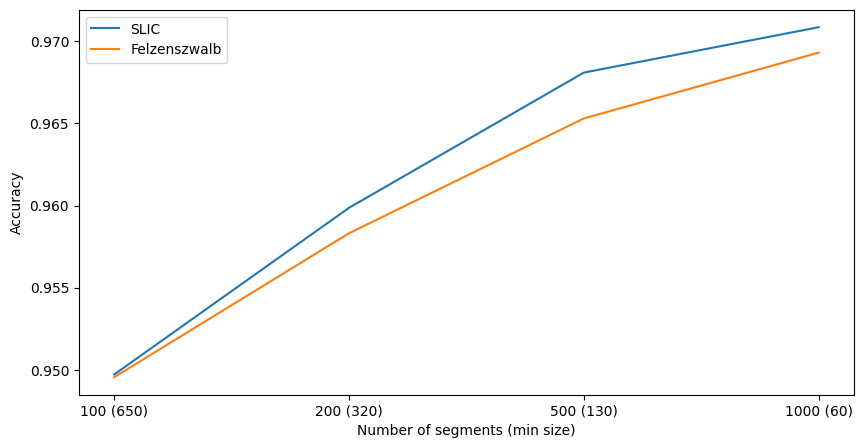

In [45]:
slic = results[results['method']=='slic']
slic = slic[slic['rgb_band']=='nir']
slic = slic[slic['index']=='NDWI']

felzenszwalb = results[results['method']=='felzenszwalb']
felzenszwalb = felzenszwalb[felzenszwalb['rgb_band']=='nir']
felzenszwalb = felzenszwalb[felzenszwalb['index']=='NDWI']

fig, ax = plt.subplots( 1, 1, figsize=(10, 5))

ax.plot([1,2,3,4], slic['accuracy'], label='SLIC')

ax.plot([1,2,3,4], felzenszwalb['accuracy'], label='Felzenszwalb')

ax.set_xticks([1,2,3,4])
ax.set_xticklabels(['100 (650)','200 (320)','500 (130)','1000 (60)'])


ax.set_xlabel('Number of segments (min size)')
ax.set_ylabel('Accuracy')

ax.legend()

utils.save_fig(fig, 'superpixel_algorithm_comparison')

In [14]:
results.sort_values(by='accuracy',ascending=False)

,method,rgb_band,size,index,accuracy
14,slic,nir,1000,NDWI,0.970844
30,felzenszwalb,nir,60,NDWI,0.969297
12,slic,nir,500,NDWI,0.968084
22,felzenszwalb,red,60,NDWI,0.967772
15,slic,nir,1000,MNDWI,0.967338
6,slic,red,1000,NDWI,0.966385
31,felzenszwalb,nir,60,MNDWI,0.965904
28,felzenszwalb,nir,130,NDWI,0.965294
20,felzenszwalb,red,130,NDWI,0.964860
13,slic,nir,500,MNDWI,0.964728


## Sense check on training images 

In [19]:
method = 'slic'
rgb_band = ['nir','green','blue']
n_segments = 1000
index = 'NDWI'

LICS train images:  30000
10937 14775 4288


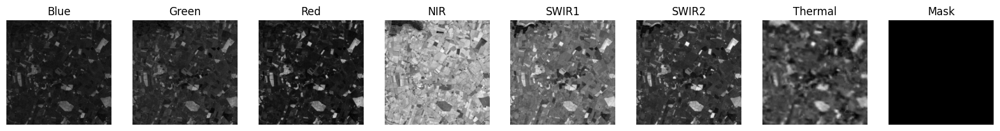

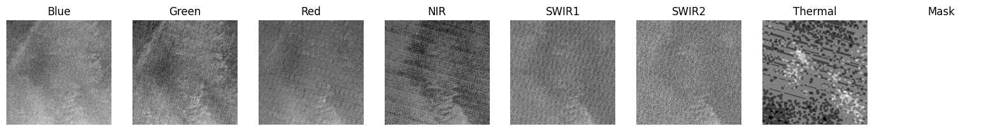

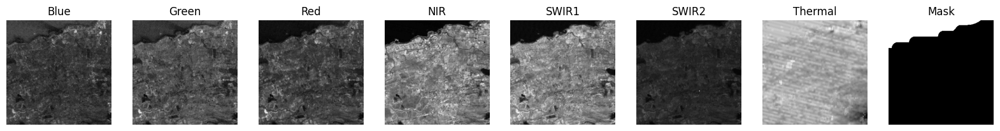

In [30]:
# Display a random image from the LICS dataset
lics_train = glob.glob('../../data/LICS/train/*.npy')
print("LICS train images: ", len(lics_train))

# get examples 
lics_land = []
lics_water = []
lics_mixed = []
for train in lics_train:
    all_bands = np.load(train)
    mask = all_bands[:,:,-1]
    if np.sum(mask) == 0:
        lics_land.append(all_bands)
    elif np.sum(mask) == mask.size:
        lics_water.append(all_bands)
    else:
        lics_mixed.append(all_bands)
    
    # break if we have 10 examples of each
    #if len(lics_land) == 10 and len(lics_water) == 10 and len(lics_mixed) == 10:
        #break;

print(len(lics_land),len(lics_water),len(lics_mixed))
utils.display_bands(lics_land[0])
utils.display_bands(lics_water[0])
utils.display_bands(lics_mixed[0])

/Users/conorosullivan/Documents/git/COASTAL MONITORING/superpixel-annotation/src/utils.py:255: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 6, figsize=(15, 5))


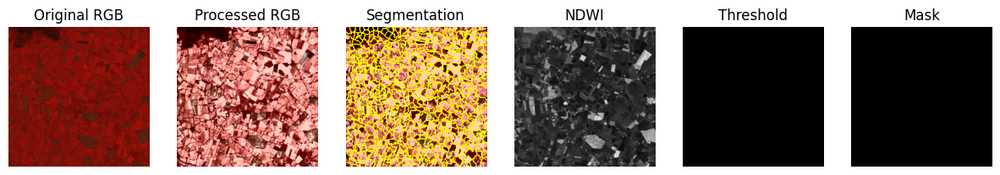

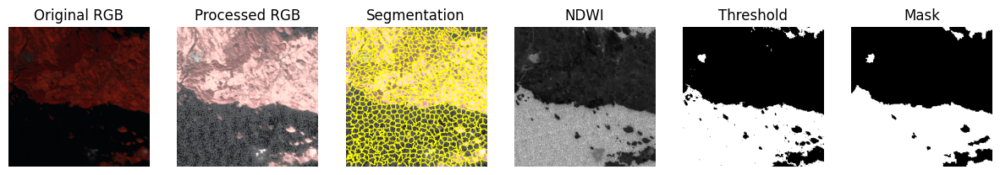

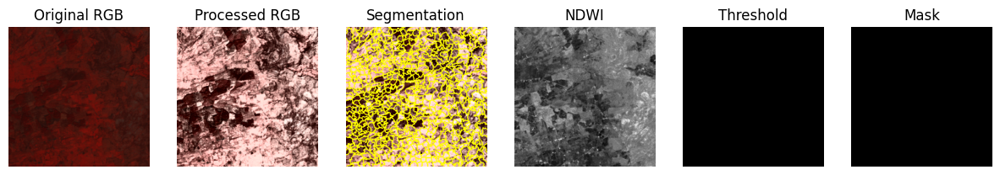

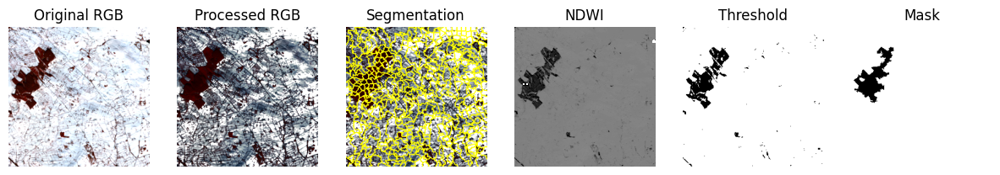

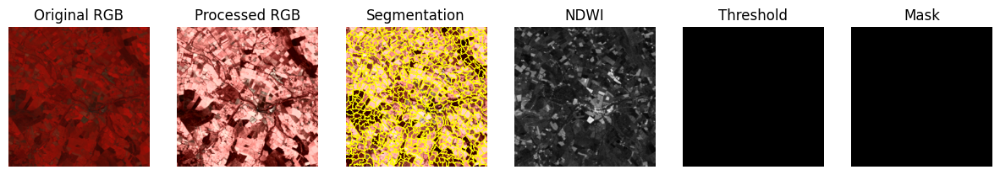

...

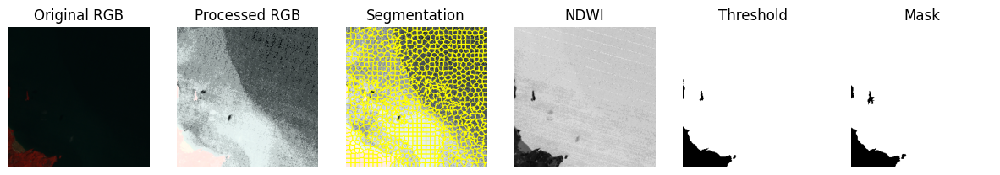

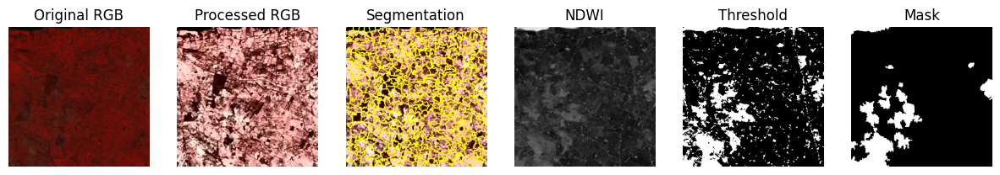

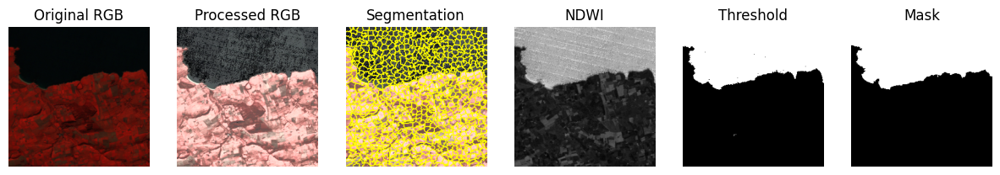

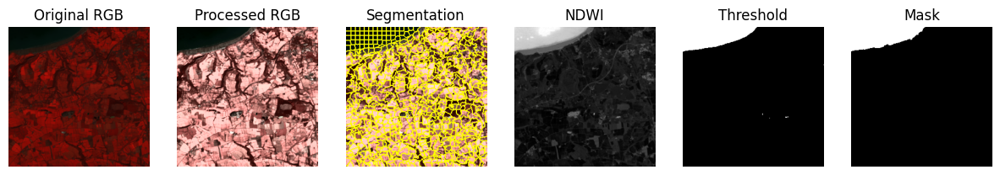

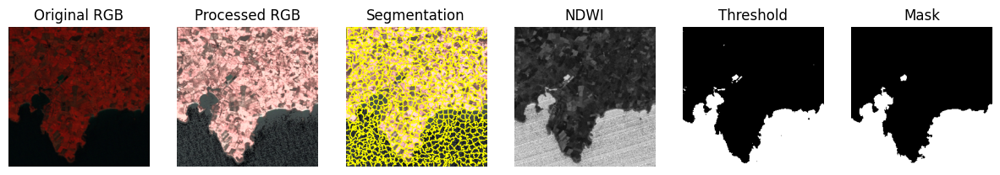

In [37]:
for lics in lics_land[0:10]:
    utils.get_mask_from_bands(lics, 
                            satellite='landsat',
                            display=True,
                            rgb_bands=rgb_band, 
                            index_name=index, 
                            threshold=-1, 
                            method=method, 
                            n_segments=n_segments)
    
for lics in lics_water[0:10]:
    utils.get_mask_from_bands(lics, 
                            satellite='landsat',
                            display=True,
                            rgb_bands=rgb_band, 
                            index_name=index, 
                            threshold=-1, 
                            method=method, 
                            n_segments=n_segments)
    
for lics in lics_mixed[0:10]:
    utils.get_mask_from_bands(lics, 
                            satellite='landsat',
                            display=True,
                            rgb_bands=rgb_band, 
                            index_name=index, 
                            threshold=-1, 
                            method=method, 
                            n_segments=n_segments)

In [45]:
# Calculate the percentage of correctly segmented images
land_count = 0 
for lics in lics_land[0:100]:
    sp = utils.get_mask_from_bands(lics, 
                            satellite='landsat',
                            display=False,
                            rgb_bands=rgb_band, 
                            index_name=index, 
                            threshold=-1, 
                            method=method, 
                            n_segments=n_segments)
    
    if np.sum(sp) == 0:
        land_count += 1

print('Land: ' ,land_count/len(lics_land),land_count)

water_count = 0
for lics in lics_water[0:100]:
    sp = utils.get_mask_from_bands(lics, 
                            satellite='landsat',
                            display=False,
                            rgb_bands=rgb_band, 
                            index_name=index, 
                            threshold=-1, 
                            method=method, 
                            n_segments=n_segments)
    
    if np.sum(sp) == sp.size:
        water_count += 1

print('Water: ' ,water_count/len(lics_water),water_count)

mixed_count = 0
for lics in lics_mixed[0:100]:
    sp = utils.get_mask_from_bands(lics, 
                            satellite='landsat',
                            display=False,
                            rgb_bands=rgb_band, 
                            index_name=index, 
                            threshold=-1, 
                            method=method, 
                            n_segments=n_segments)
    
    if len(np.unique(sp)) > 1:
        mixed_count += 1

print('Mixed: ' ,mixed_count/len(lics_mixed),mixed_count)

Land:  0.0034744445460363903 38
Water:  0.0038578680203045683 57
Mixed:  0.02308768656716418 99


5


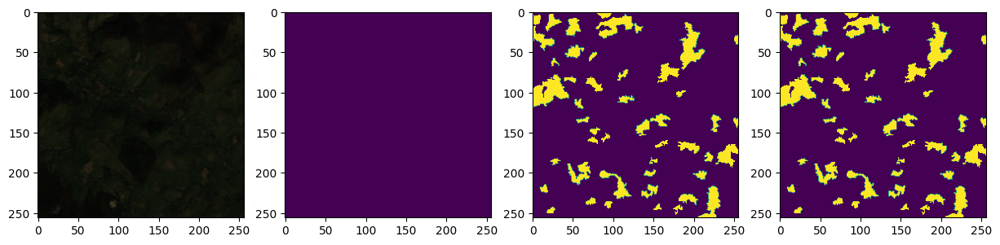

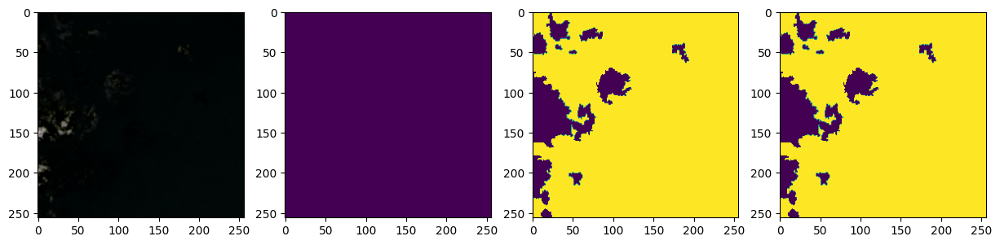

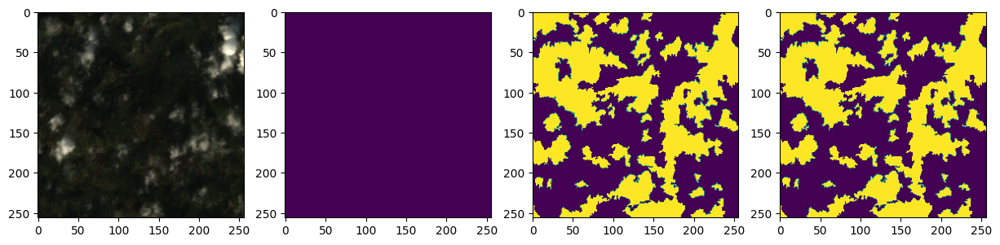

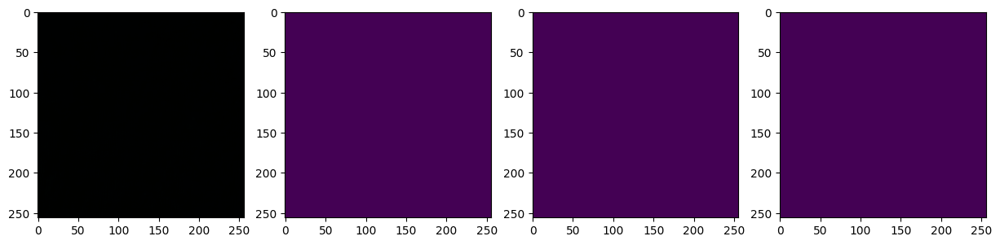

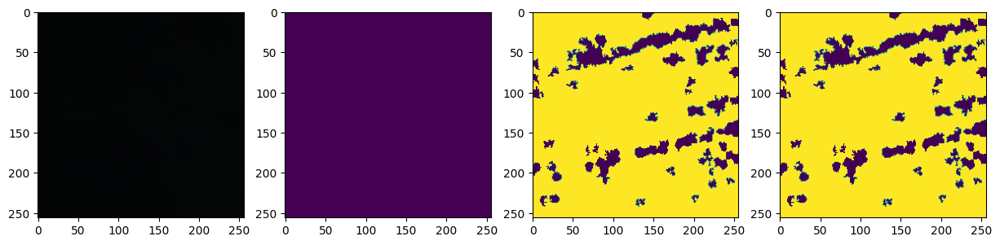

In [49]:
# addtional sense check 
# these images are downloaded from cluster to ensure sp algorithm is working correctly

# load finetune dataset 
sensecheck_lics = glob.glob(base_path + 'lics sensecheck/*.npy')
print(len(sensecheck_lics))

for inst in sensecheck_lics:
    all_bands = np.load(inst)

    rgb = utils.get_rgb(all_bands)

    orignal_mask = all_bands[:,:,-2]

    cluster_mask = all_bands[:,:,-1]

    mask = utils.get_mask_from_bands(all_bands, 
                                     satellite='landsat',
                                     rgb_bands=['nir','green','blue'],
                                     threshold=-1, 
                                     index_name='NDWI',
                                     method='slic', 
                                     n_segments=1000)
    
    fig, ax = plt.subplots(1,4,figsize=(15,5))
    ax[0].imshow(rgb)
    ax[1].imshow(orignal_mask)
    ax[2].imshow(cluster_mask)
    ax[3].imshow(mask)
    
    assert np.sum(mask) == np.sum(cluster_mask)

# Images for paper